#Data Analysis using pyspark
PySpark is the Python API for Apache Spark. It enables us to perform real-time, large-scale data processing in a distributed environment using Python.

In [ ]:
#Run this command to download data
!wget https://stats.idre.ucla.edu/stat/data/rdm/patient_pt2_dm.csv -O patient_pt2_dm.csv

--2024-03-23 05:00:52--  https://stats.idre.ucla.edu/stat/data/rdm/patient_pt2_dm.csv
Resolving stats.idre.ucla.edu (stats.idre.ucla.edu)... 128.97.141.21
Connecting to stats.idre.ucla.edu (stats.idre.ucla.edu)|128.97.141.21|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://stats.oarc.ucla.edu/stat/data/rdm/patient_pt2_dm.csv [following]
--2024-03-23 05:00:53--  https://stats.oarc.ucla.edu/stat/data/rdm/patient_pt2_dm.csv
Resolving stats.oarc.ucla.edu (stats.oarc.ucla.edu)... 128.97.141.31
Connecting to stats.oarc.ucla.edu (stats.oarc.ucla.edu)|128.97.141.31|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 17279 (17K) [text/csv]
Saving to: ‘patient_pt2_dm.csv’

patient_pt2_dm.csv  100%[===================>]  16.87K  --.-KB/s    in 0.06s   

2024-03-23 05:00:53 (263 KB/s) - ‘patient_pt2_dm.csv’ saved [17279/17279]



In [ ]:
!pip install pyspark
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pyspark.sql.functions as F
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.regression import LinearRegression
from pyspark.ml.feature import StandardScaler
from pyspark.ml.clustering import KMeans

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 317.0/317.0 MB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyspark: filename=pyspark-3.5.1-py2.py3-none-any.whl size=317488491 sha256=13affd5122fa3101b78f0a8fa7de7bd10cb66495a3d2bba9f8f97bd3d7c5335c
  Stored in directory: /root/.cache/pip/wheels/80/1d/60/2c256ed38dddce2fdd93be545214a63e02fbd8d74fb0b7f3a6
Successfully built pyspark


In [ ]:
from pyspark.sql import SparkSession

spark = SparkSession.builder \
    .appName("Hospital Data Analysis") \
    .getOrCreate()

In [ ]:
df = spark.read.csv('/content/patient_pt2_dm.csv', header=True, inferSchema=True)

In [ ]:
df.show(5)

+------------+------+-----+---------+------+---------+---------+---------+----+---------+---------+-----+--------+-------+---------+------------+-------+--------+---------+-----------+------------+-----------+---------+---------+
|    hospital|hospid|docid| dis_date|   sex|      age|    test1|    test2|pain|tumorsize|      co2|wound|mobility|ntumors|remission|lungcapacity|married|familyhx|smokinghx|cancerstage|lengthofstay|        wbc|      rbc|      bmi|
+------------+------+-----+---------+------+---------+---------+---------+----+---------+---------+-----+--------+-------+---------+------------+-------+--------+---------+-----------+------------+-----------+---------+---------+
|Cedars-Sinai|     3|3-227| 1-Oct-09|  male|54.201389|3.8687944| 1.368258|   6|69.770042|1.5255331|    5|       5|      4|        0|  0.91088128|      1|      no|    never|          I|           4|6422.606934|5.3941827|32.246693|
|Cedars-Sinai|     3|3-227|18-Feb-10|female|55.074692|7.7555981|4.4953203|   8|6

In [ ]:
df.printSchema()

root
 |-- hospital: string (nullable = true)
 |-- hospid: integer (nullable = true)
 |-- docid: string (nullable = true)
 |-- dis_date: string (nullable = true)
 |-- sex: string (nullable = true)
 |-- age: double (nullable = true)
 |-- test1: double (nullable = true)
 |-- test2: double (nullable = true)
 |-- pain: integer (nullable = true)
 |-- tumorsize: double (nullable = true)
 |-- co2: double (nullable = true)
 |-- wound: integer (nullable = true)
 |-- mobility: integer (nullable = true)
 |-- ntumors: integer (nullable = true)
 |-- remission: integer (nullable = true)
 |-- lungcapacity: double (nullable = true)
 |-- married: integer (nullable = true)
 |-- familyhx: string (nullable = true)
 |-- smokinghx: string (nullable = true)
 |-- cancerstage: string (nullable = true)
 |-- lengthofstay: integer (nullable = true)
 |-- wbc: string (nullable = true)
 |-- rbc: double (nullable = true)
 |-- bmi: double (nullable = true)



In [ ]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import isnan, when, count
from pyspark.ml.feature import Imputer

# Step 1: Identify Missing Values
print("Step 1: Identifying Missing Values")
df.select([count(when(isnan(c) | df[c].isNull(), c)).alias(c) for c in df.columns]).show()

# Step 2: Handle Missing Values
print("\nStep 2: Handling Missing Values")
# For numerical columns, impute missing values with mean
num_cols = [c for c, t in df.dtypes if t != 'string']
imputer = Imputer(strategy='mean', inputCols=num_cols, outputCols=[c + "_imputed" for c in num_cols])
df_imputed = imputer.fit(df).transform(df)

# For categorical columns, replace missing values with the most frequent value
for c in [c for c, t in df.dtypes if t == 'string']:
    mode_value = df_imputed.groupBy(c).count().orderBy("count", ascending=False).first()[0]
    df_imputed = df_imputed.withColumn(c + "_imputed", when(df_imputed[c].isNull(), mode_value).otherwise(df_imputed[c]))

Step 1: Identifying Missing Values
+--------+------+-----+--------+---+---+-----+-----+----+---------+---+-----+--------+-------+---------+------------+-------+--------+---------+-----------+------------+---+---+---+
|hospital|hospid|docid|dis_date|sex|age|test1|test2|pain|tumorsize|co2|wound|mobility|ntumors|remission|lungcapacity|married|familyhx|smokinghx|cancerstage|lengthofstay|wbc|rbc|bmi|
+--------+------+-----+--------+---+---+-----+-----+----+---------+---+-----+--------+-------+---------+------------+-------+--------+---------+-----------+------------+---+---+---+
|       0|     0|    0|       0|  0|  0|    0|    0|   0|        0|  0|    0|       0|      0|        0|           0|      0|       0|        0|          0|           0|  0|  0|  0|
+--------+------+-----+--------+---+---+-----+-----+----+---------+---+-----+--------+-------+---------+------------+-------+--------+---------+-----------+------------+---+---+---+


Step 2: Handling Missing Values


In [ ]:
print('Number of rows: \t', df.count())
print('Number of columns: \t', len(df.columns))
df.describe().show()

Number of rows: 	 111
Number of columns: 	 24
+-------+--------------+------+-----+--------+------+------------------+------------------+------------------+------------------+------------------+------------------+------------------+------------------+------------------+-------------------+------------------+-------------------+--------+---------+-----------+------------------+------------------+-------------------+------------------+
|summary|      hospital|hospid|docid|dis_date|   sex|               age|             test1|             test2|              pain|         tumorsize|               co2|             wound|          mobility|           ntumors|          remission|      lungcapacity|            married|familyhx|smokinghx|cancerstage|      lengthofstay|               wbc|                rbc|               bmi|
+-------+--------------+------+-----+--------+------+------------------+------------------+------------------+------------------+------------------+------------------+---

In [ ]:
#Replacing outliers with mode
from pyspark.sql.functions import lit, approx_count_distinct, desc
df_no_outliers = df.replace(-99, None)

mode_values = {}
for col_name in df_no_outliers.columns:
    mode_values[col_name] = df_no_outliers.agg(approx_count_distinct(col_name)).collect()[0][0]

# Replace -99 outliers with mode values
for col_name, mode_val in mode_values.items():
    df = df.withColumn(col_name, when(df[col_name] == -99, lit(mode_val)).otherwise(df[col_name]))

#co2 column has -98 as outlier
col_name='co2'
mode_values['co2'] = df_no_outliers.agg(approx_count_distinct('co2')).collect()[0][0]
df = df.withColumn(col_name, when(df[col_name] == -98, lit(mode_val)).otherwise(df[col_name]))


df.describe().show()

+-------+--------------+------+-----+--------+------+------------------+------------------+------------------+------------------+------------------+-----------------+------------------+------------------+------------------+-------------------+-----------------+-------------------+--------+---------+-----------+------------------+------------------+-------------------+------------------+
|summary|      hospital|hospid|docid|dis_date|   sex|               age|             test1|             test2|              pain|         tumorsize|              co2|             wound|          mobility|           ntumors|          remission|     lungcapacity|            married|familyhx|smokinghx|cancerstage|      lengthofstay|               wbc|                rbc|               bmi|
+-------+--------------+------+-----+--------+------+------------------+------------------+------------------+------------------+------------------+-----------------+------------------+------------------+----------------

In [ ]:
def plot_histogram(column_data, column_name):
    plt.figure(figsize=(10, 6))
    plt.hist(column_data, bins=20, color='skyblue', edgecolor='black')
    plt.title(f'Histogram of {column_name}')
    plt.xlabel(column_name)
    plt.ylabel('Frequency')
    plt.show()


def hist_plot(column_name):
    column_data = df.select(column_name).rdd.flatMap(lambda x: x).collect()
    # Plot histogram for the specified column
    plot_histogram(column_data, column_name)

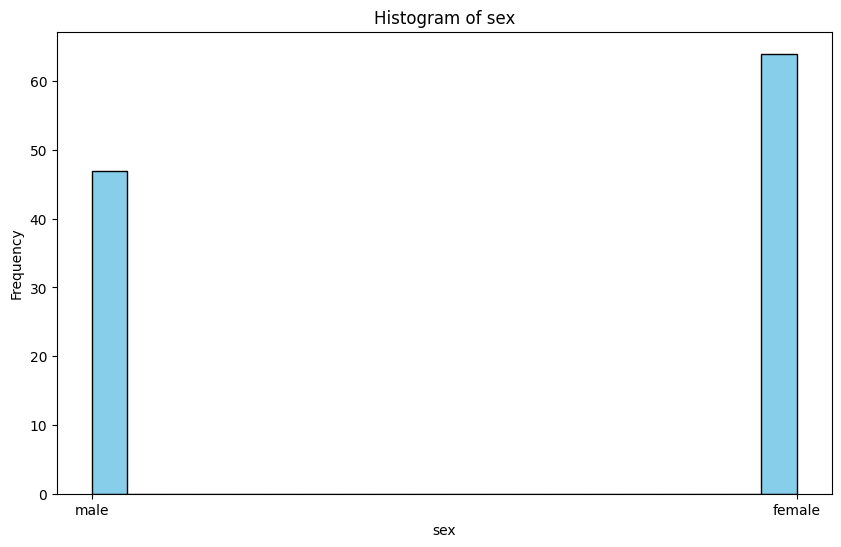

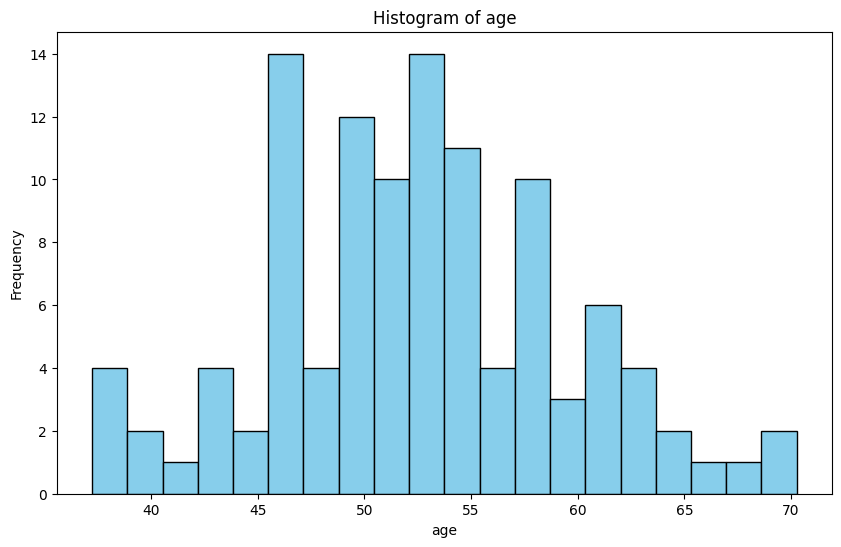

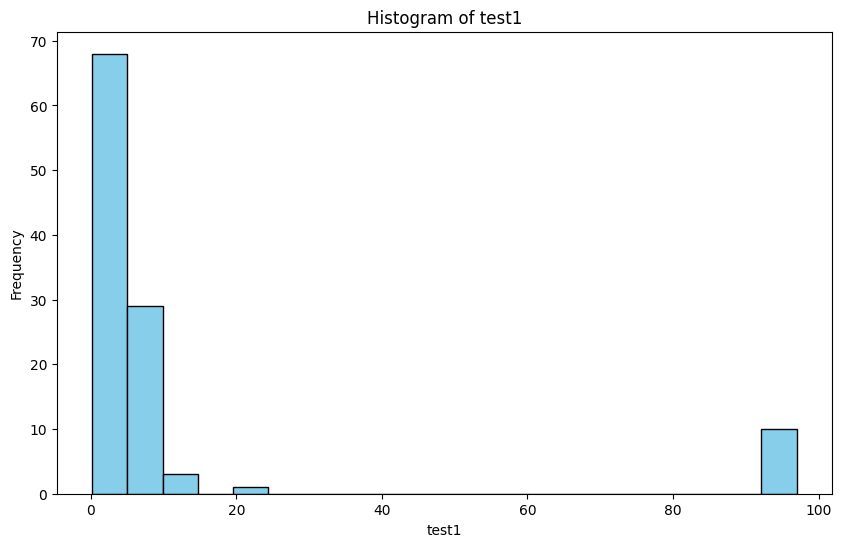

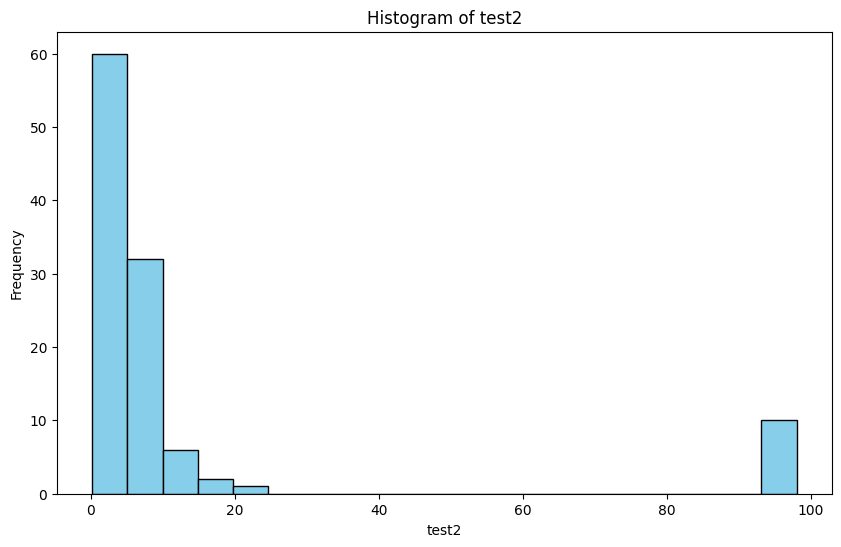

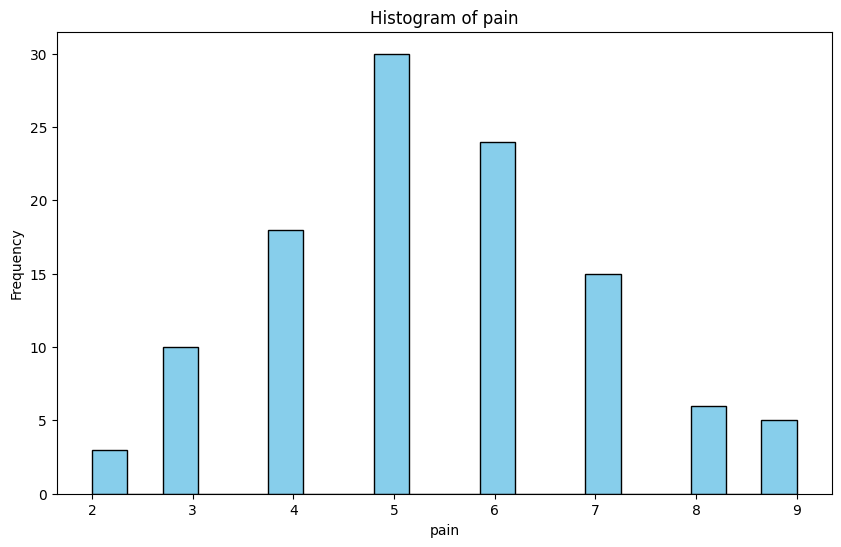

...

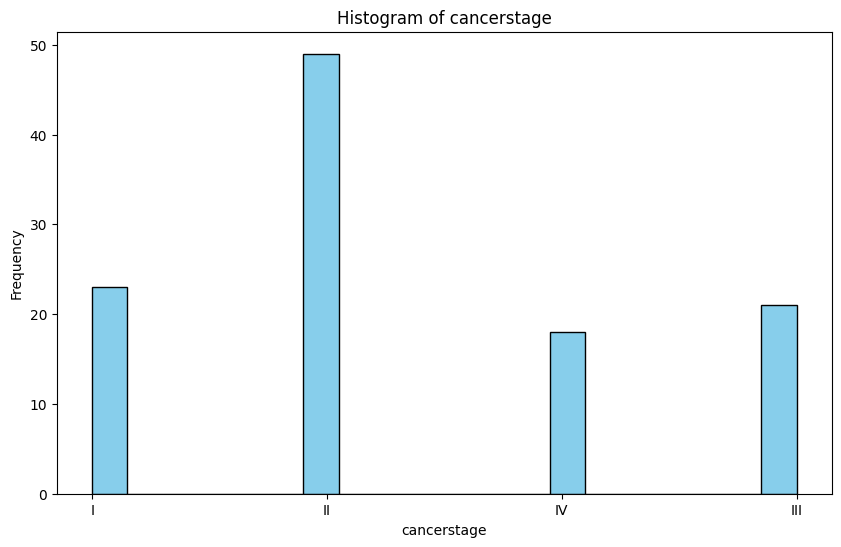

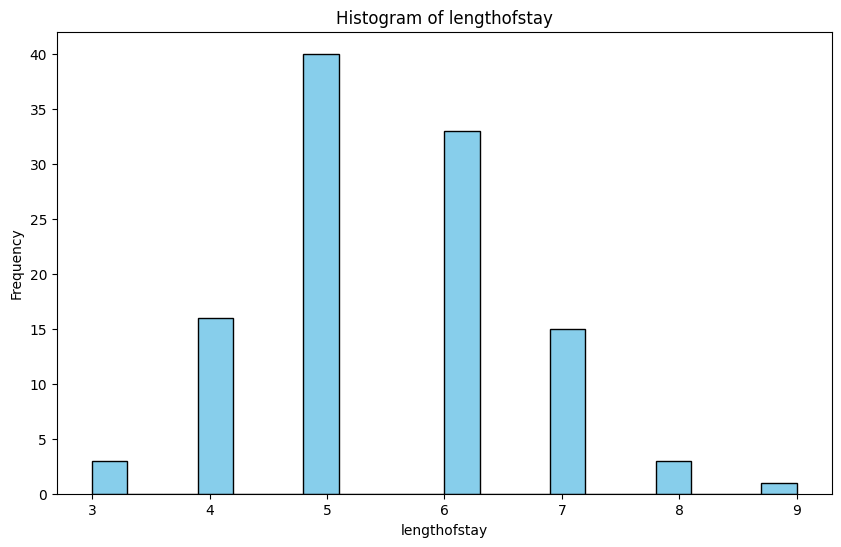

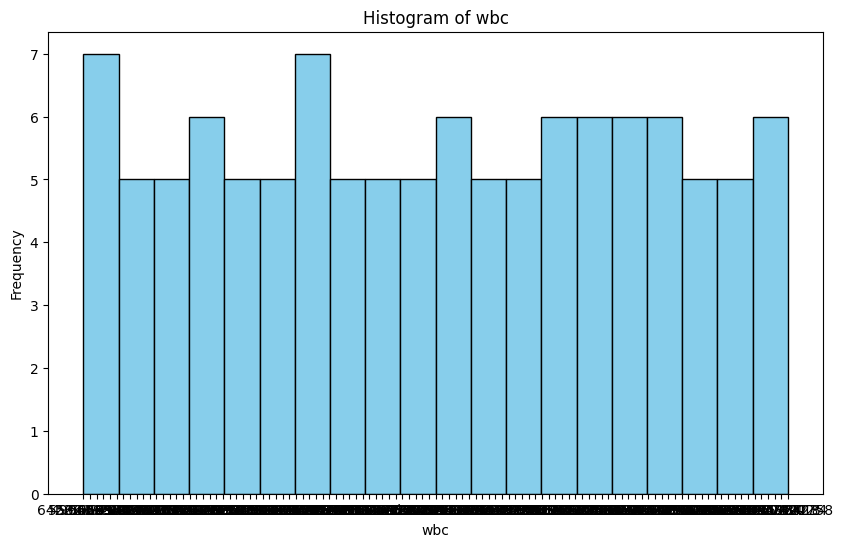

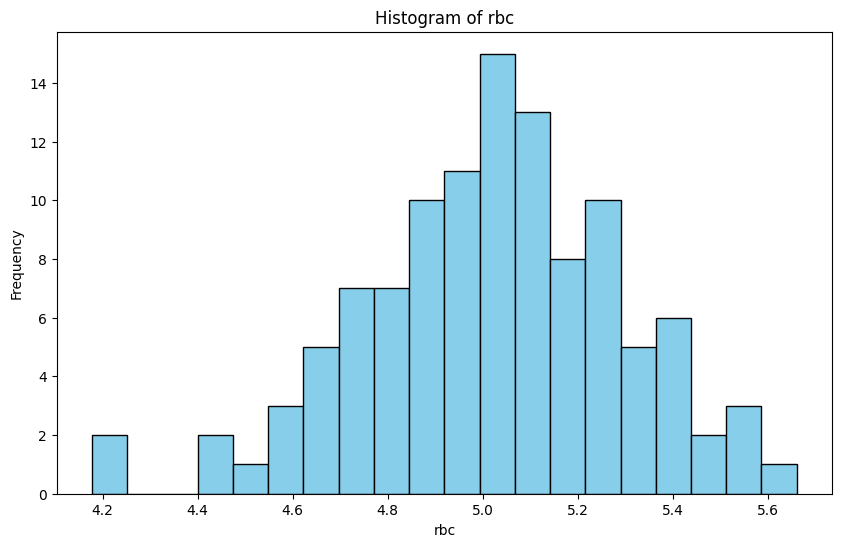

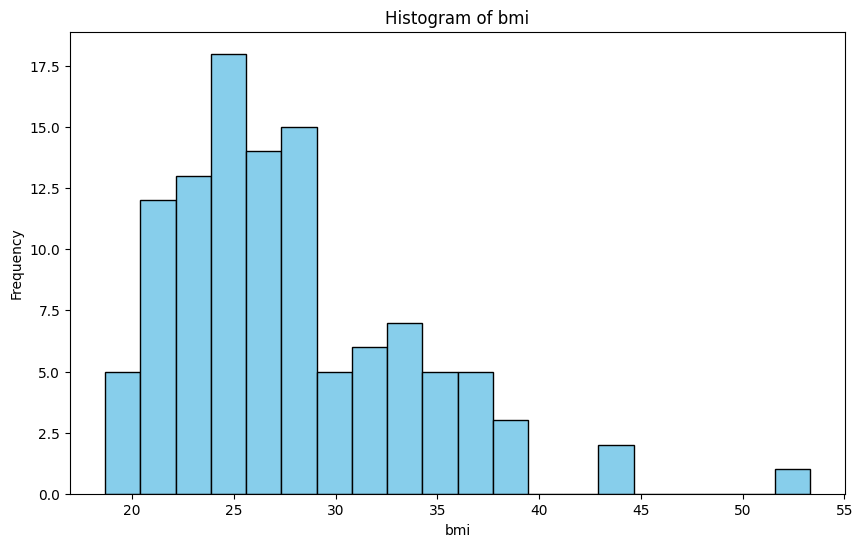

In [ ]:
# List of columns to plot
columns_to_plot = ["sex", "age", "test1", "test2", "pain", "tumorsize",
                   "co2", "wound", "mobility", "ntumors", "remission",
                   "lungcapacity", "married", "familyhx", "smokinghx",
                   "cancerstage", "lengthofstay", "wbc", "rbc", "bmi"]

# Plot histograms for each column
for column in columns_to_plot:
    hist_plot(column)

##We can easily get some insights from this Plots like
1.More females than males.  
2.More patients of middle ages(45-65 years old)  
3.Middle Range of pain(4-6) is common.  
4.Tumoursize also follows normal like distribution

In [ ]:
# Define a function to plot box plot for a column
def plot_boxplot(column_data, column_name):
    plt.figure(figsize=(10, 6))
    plt.boxplot(column_data, vert=False)
    plt.title(f'Box Plot of {column_name}')
    plt.xlabel(column_name)
    plt.show()

def box_plot(column_name):
    column_data = df.filter(df[column_name].isNotNull()).select(column_name).rdd.flatMap(lambda x: x).collect()
    plot_boxplot(column_data, column_name)

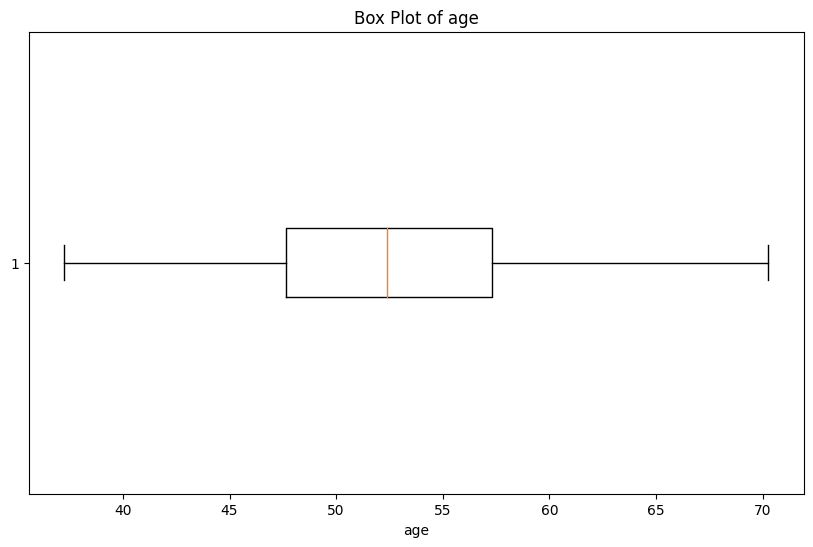

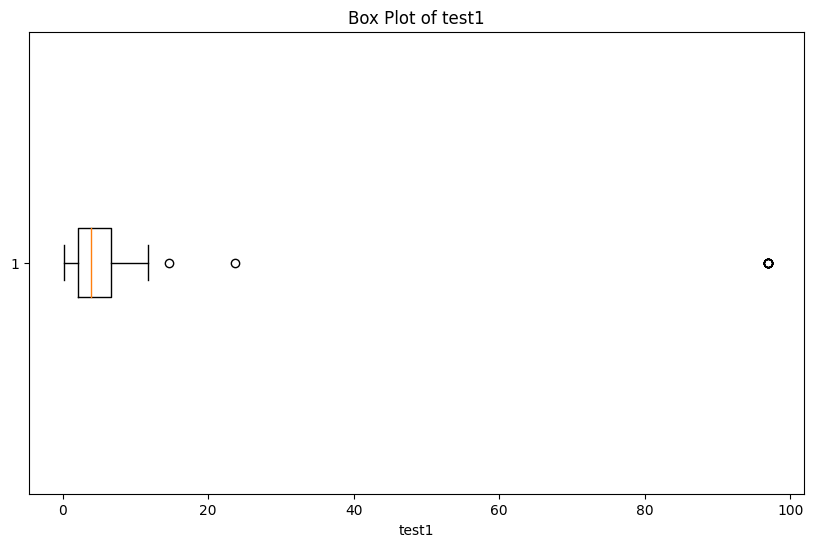

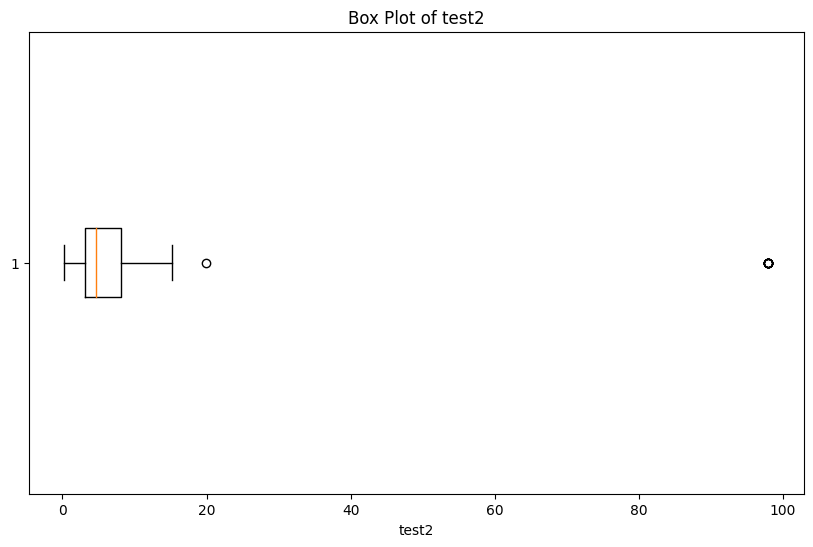

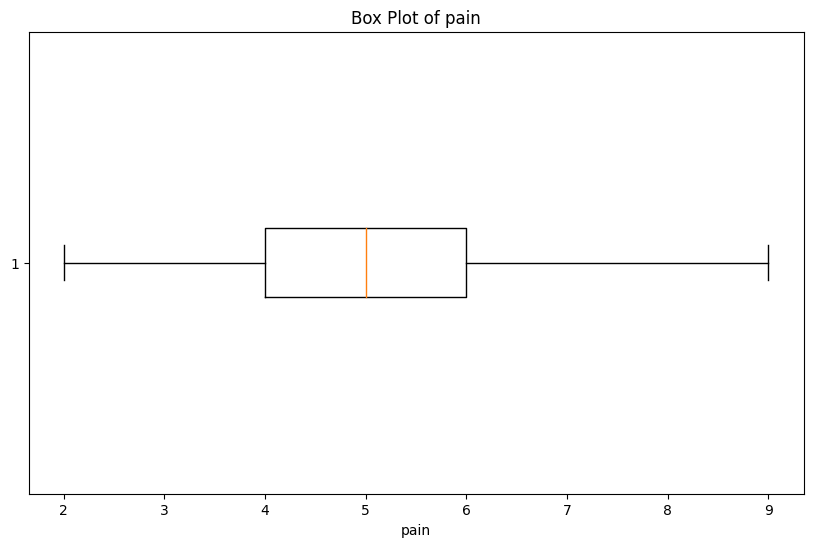

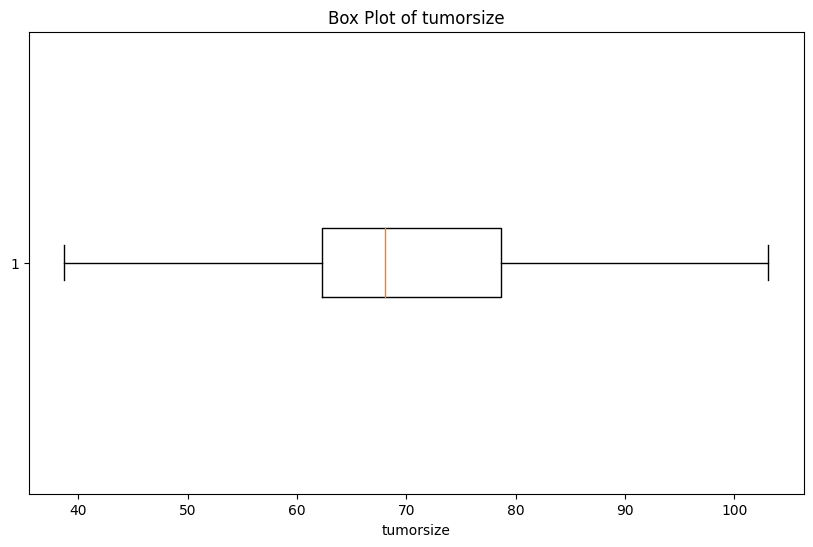

...

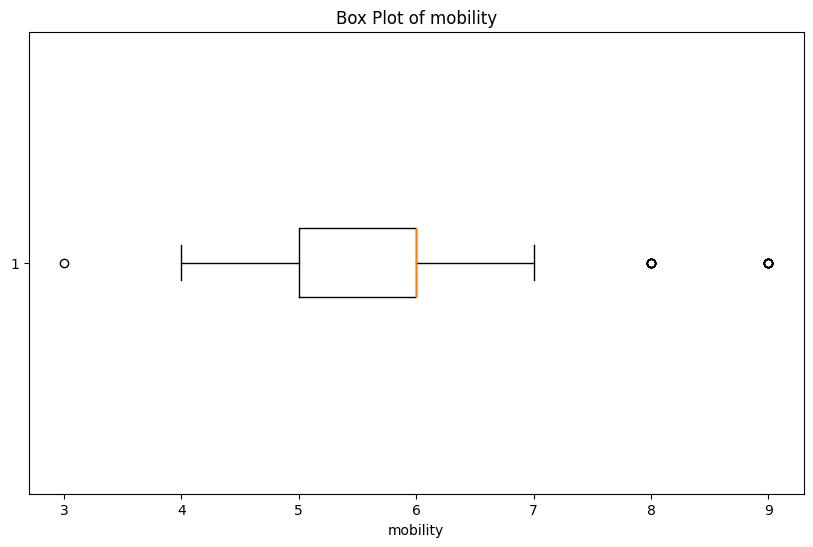

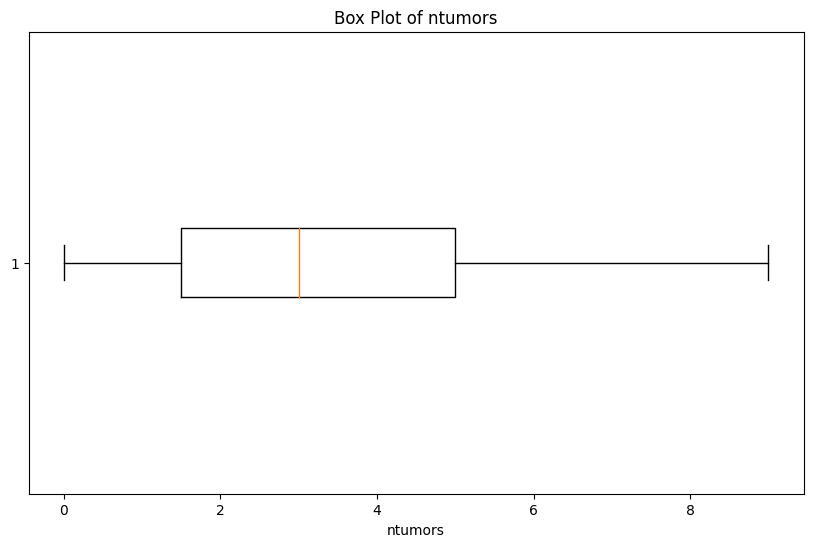

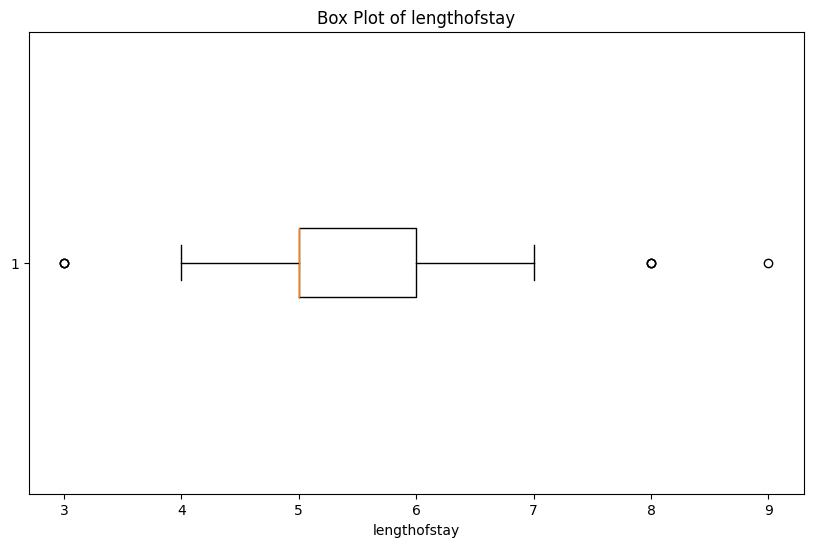

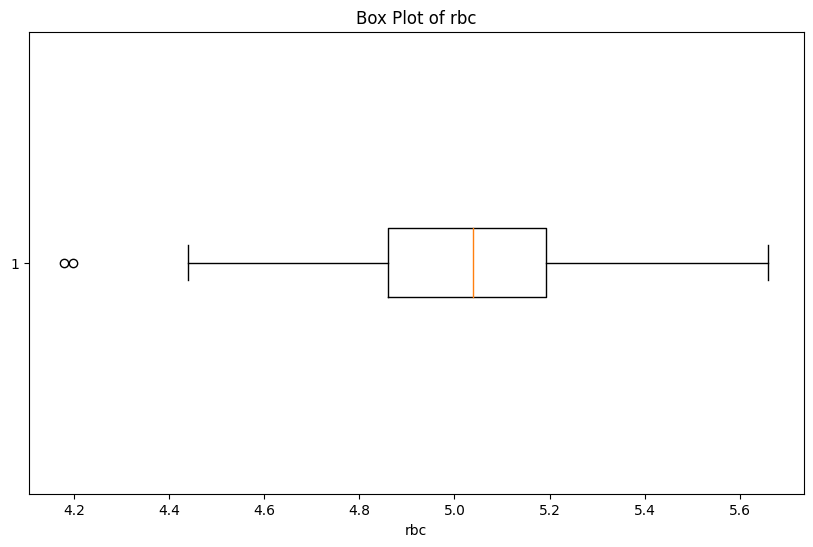

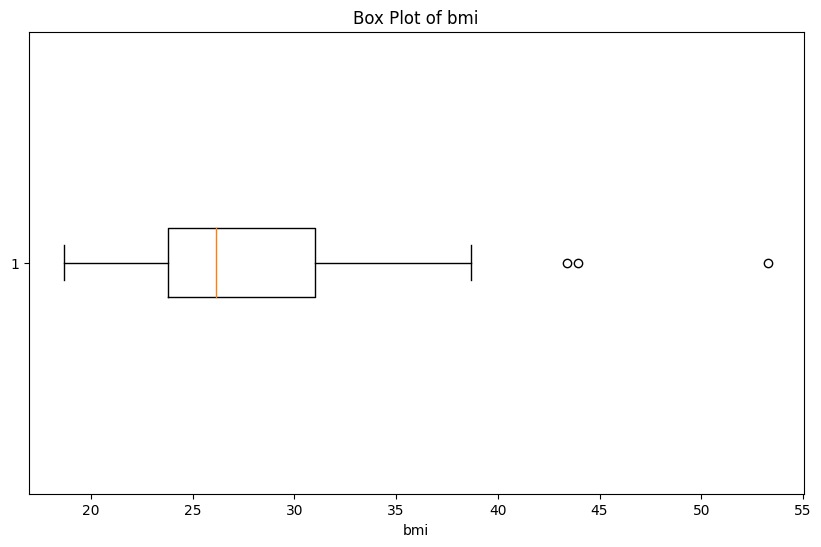

In [ ]:
# Columns to plot
columns_to_plot = [ 'age', 'test1', 'test2', 'pain', 'tumorsize', 'wound',
                   'mobility', 'ntumors', 'lengthofstay', 'rbc', 'bmi']

# Plotting each column
for col_name in columns_to_plot:
    box_plot(col_name)

In [ ]:
# Define a function to plot scatter plot for a pair of columns
def plot_scatter(df, col1, col2):
    plt.figure(figsize=(10, 6))
    plt.scatter(df[col1], df[col2], alpha=0.5, color='blue')
    plt.title(f'Scatter Plot of {col1} vs {col2}')
    plt.xlabel(col1)
    plt.ylabel(col2)
    plt.grid(True)
    plt.show()

# Convert Spark DataFrame to Pandas DataFrame
df_pd = df.toPandas()
def scatter_plot(col1, col2):
    plot_scatter(df_pd, col1, col2)

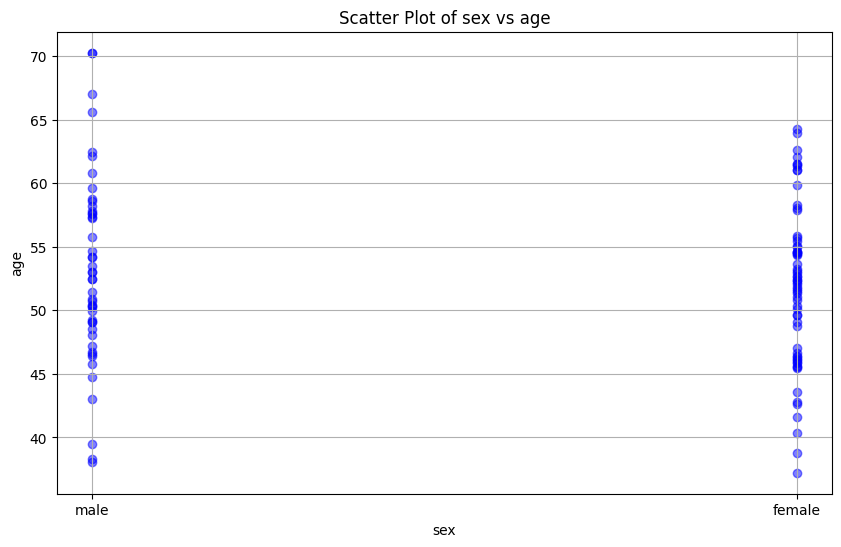

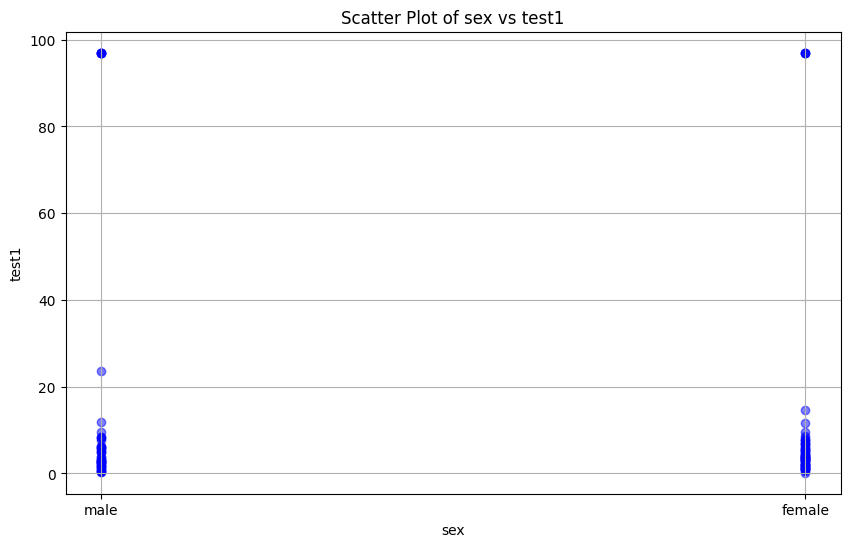

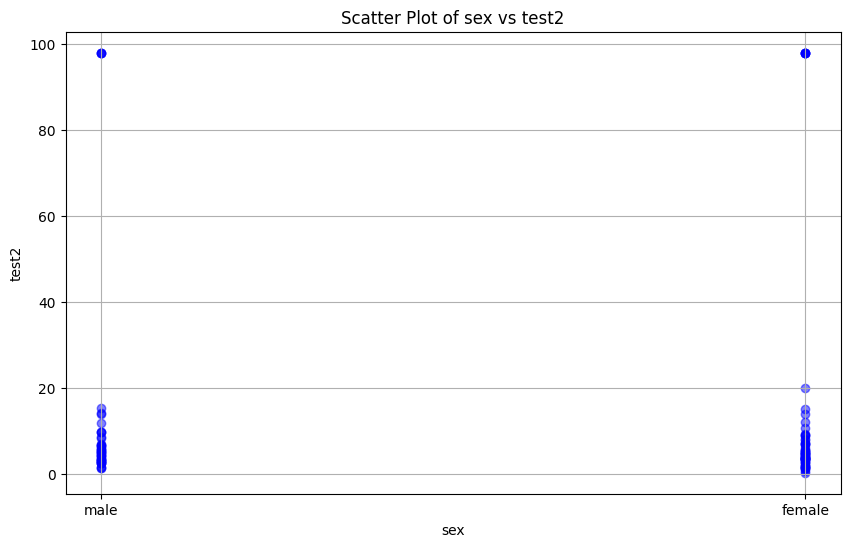

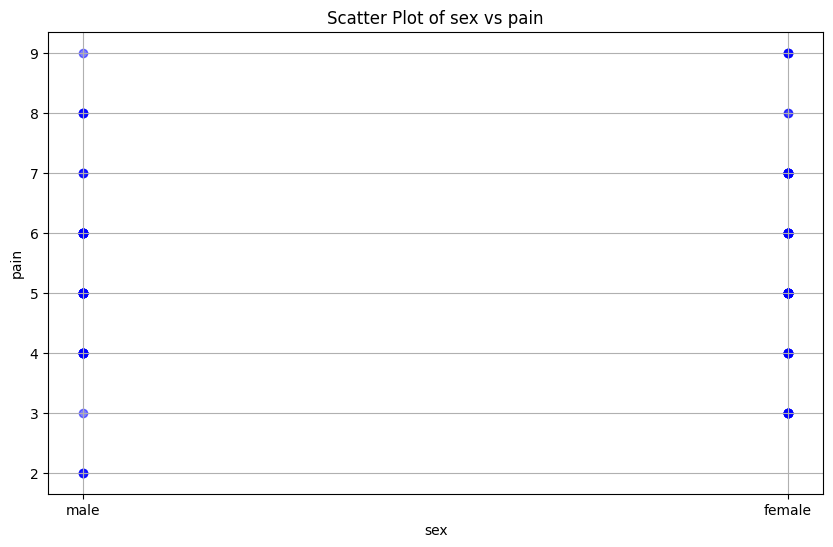

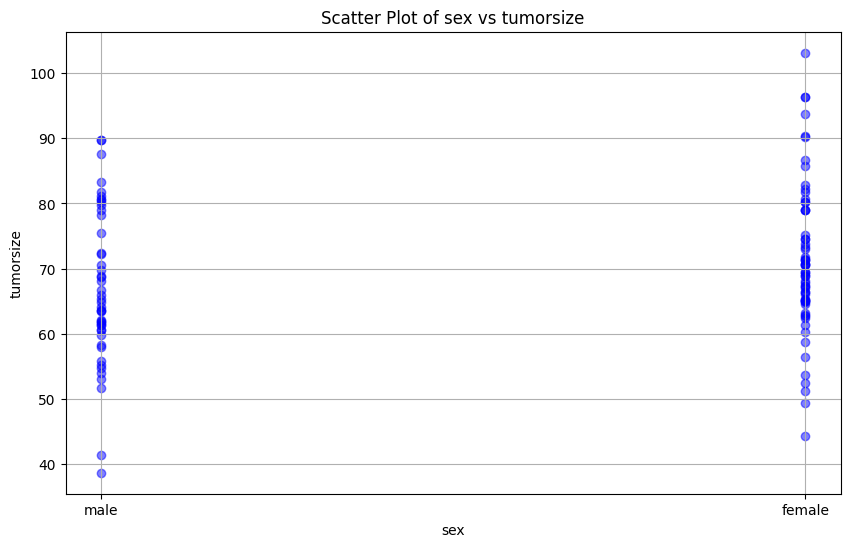

...

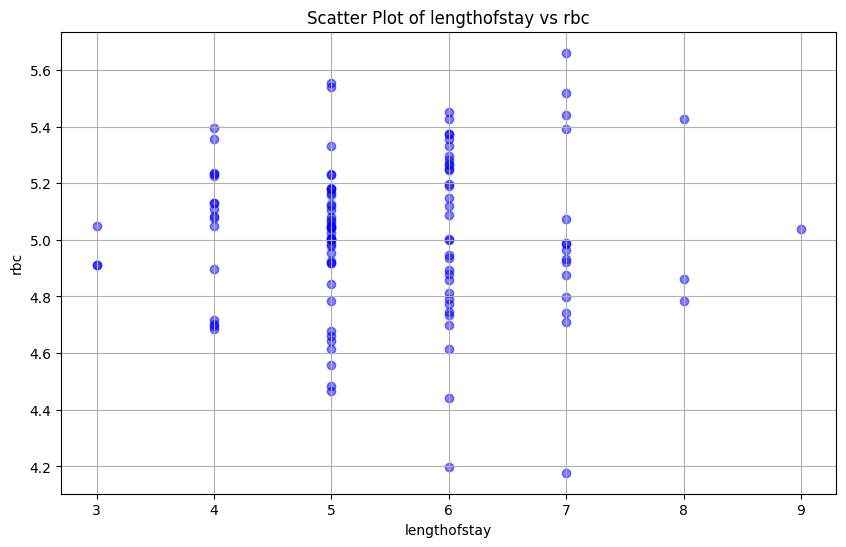

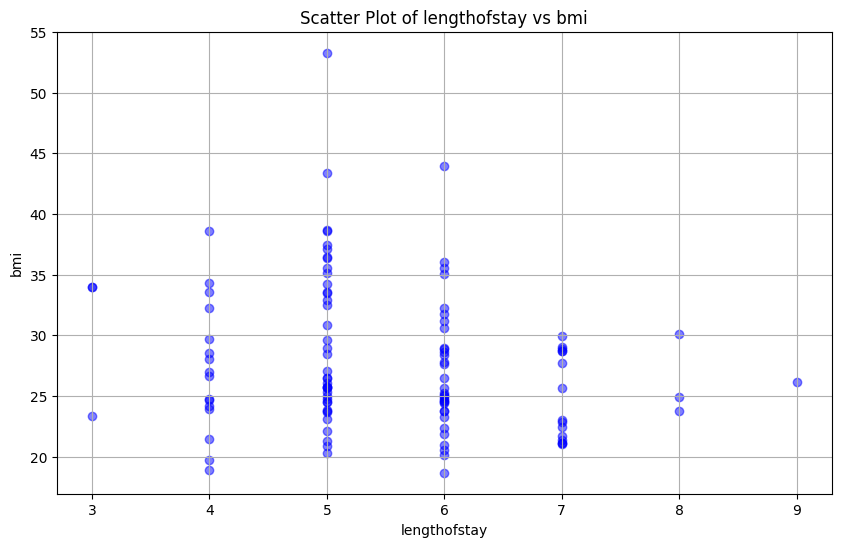

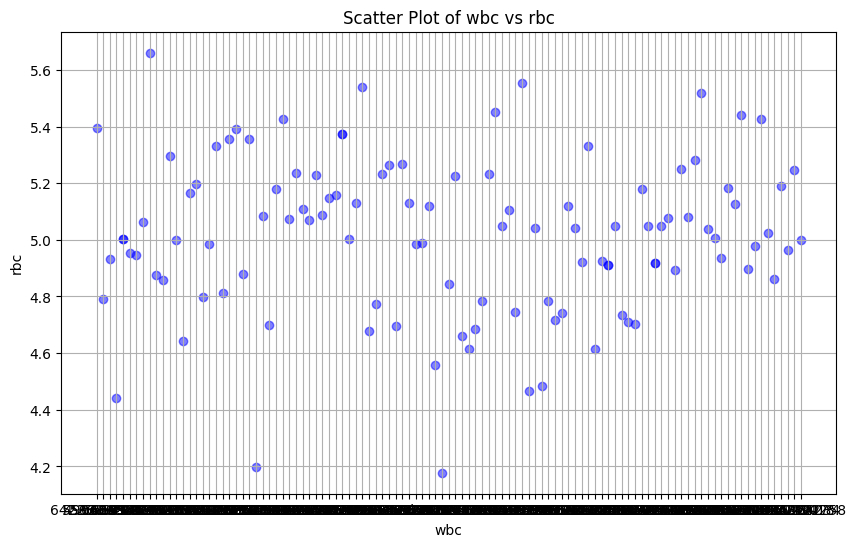

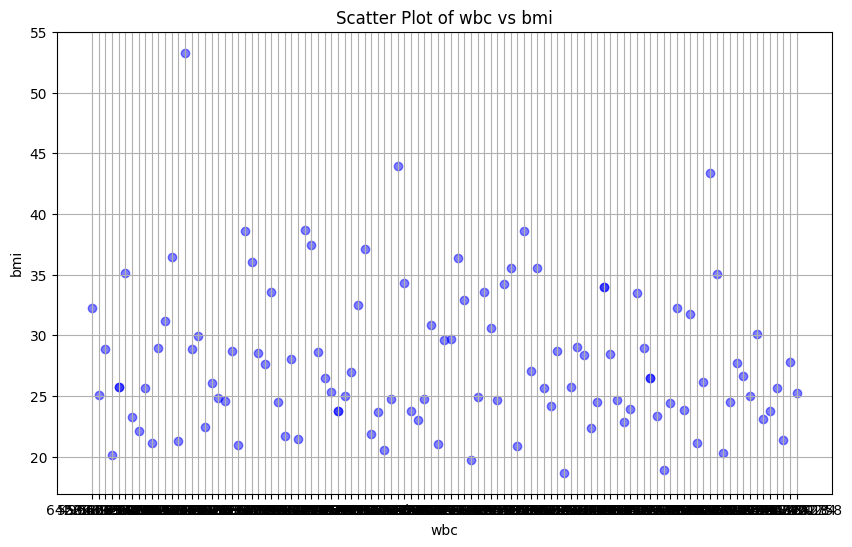

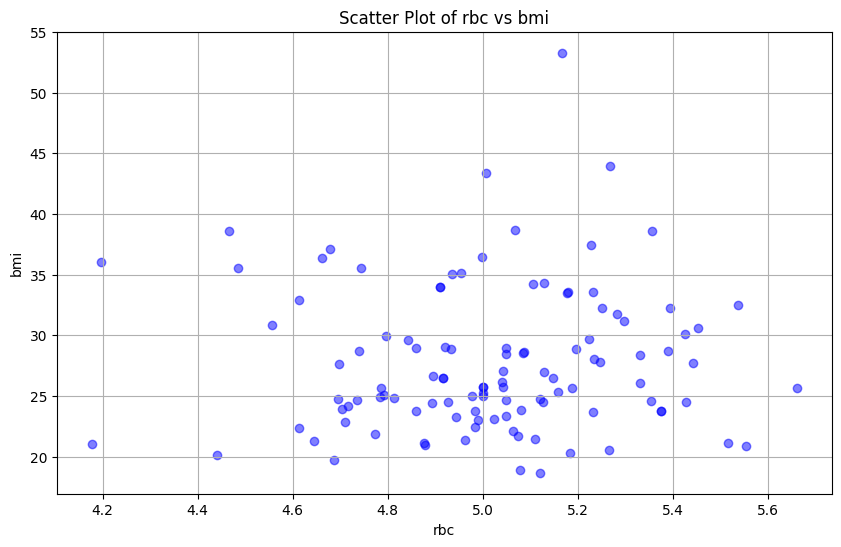

In [ ]:
def scatter_plot(df, cols):
    for i in range(len(cols)):
        for j in range(i+1, len(cols)):
            plot_scatter(df, cols[i], cols[j])

# List of columns to plot
columns_to_plot = ['sex', 'age', 'test1', 'test2', 'pain', 'tumorsize', 'co2', 'wound', 'mobility', 'ntumors', 'remission', 'lungcapacity', 'married', 'familyhx', 'smokinghx', 'cancerstage', 'lengthofstay', 'wbc', 'rbc', 'bmi']

# Plot scatter plot for each pair of columns
scatter_plot(df_pd, columns_to_plot)

In [ ]:
# Define a function to plot pie chart for a column
def plot_pie_chart(df, col_name, group_by_col):
    # Group the DataFrame by group_by_col and col_name
    grouped_df = df.groupBy(group_by_col).agg(F.mean(col_name).alias(col_name)).orderBy(group_by_col)

    # Collect data for each group within group_by_col
    labels = grouped_df.select(group_by_col).rdd.flatMap(lambda x: x).collect()
    sizes = grouped_df.select(col_name).rdd.flatMap(lambda x: x).collect()

    # Plot pie chart
    plt.figure(figsize=(8, 6))
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140)
    plt.title(f'Pie Chart for {col_name} grouped by {group_by_col}')
    plt.axis('equal')
    plt.show()

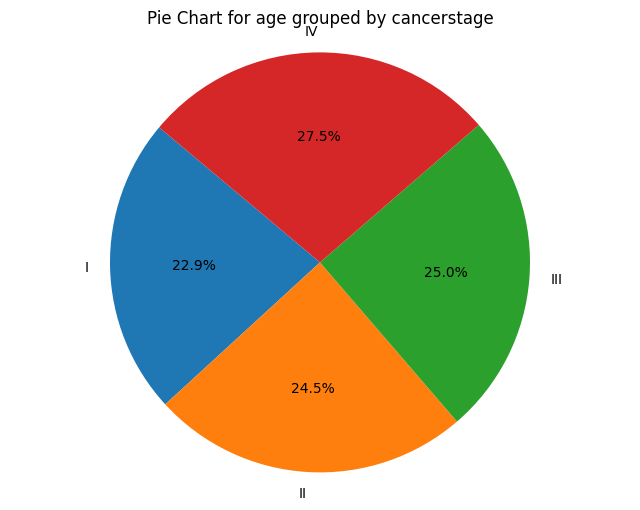

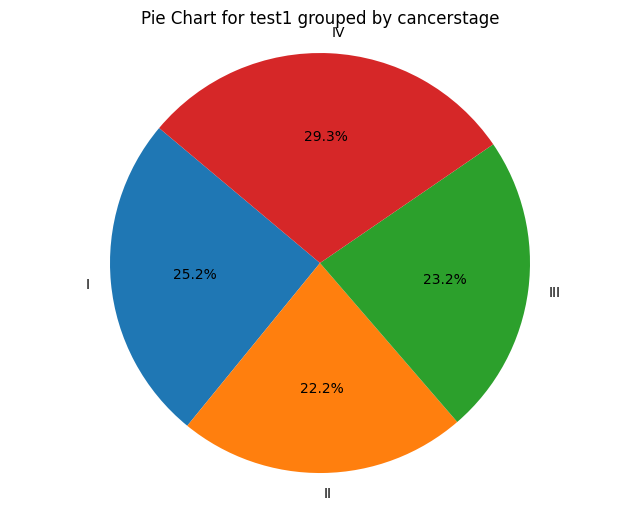

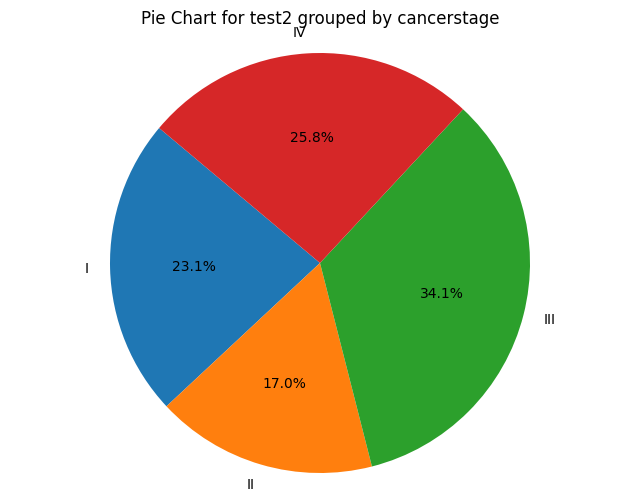

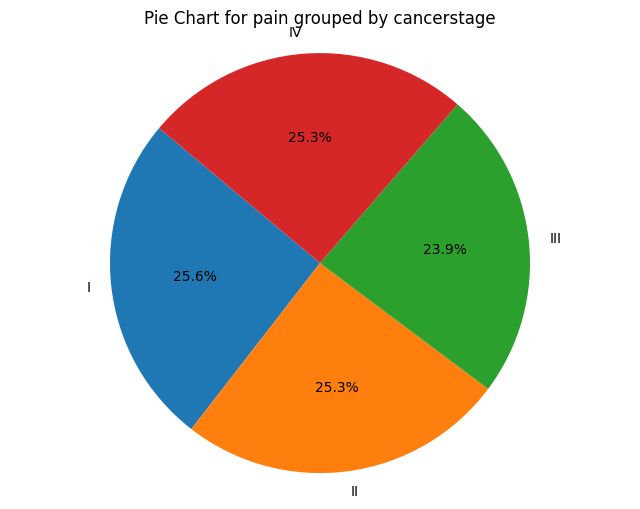

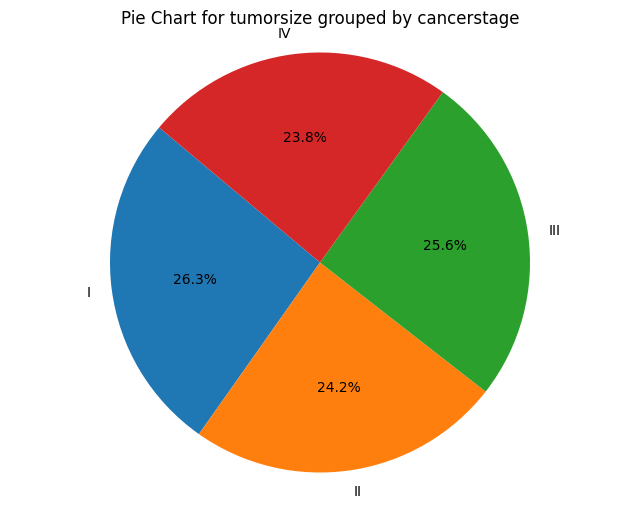

...

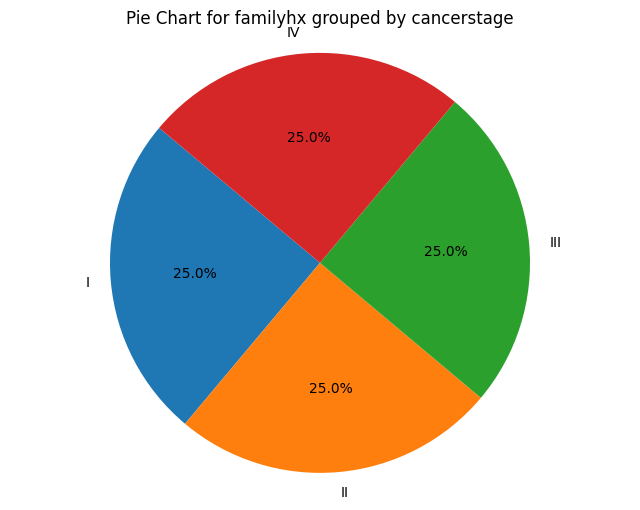

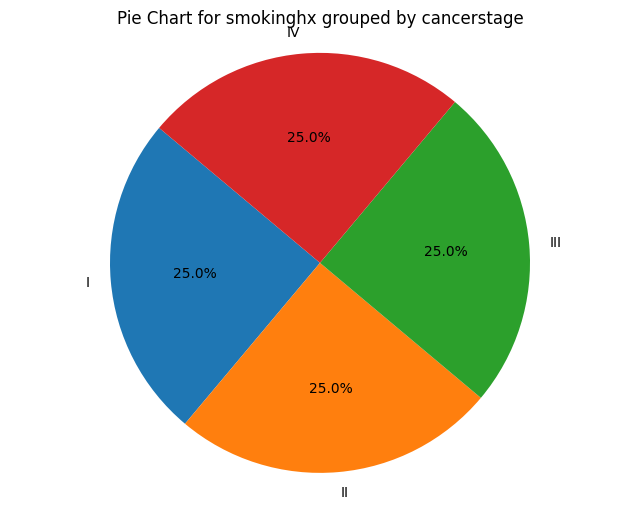

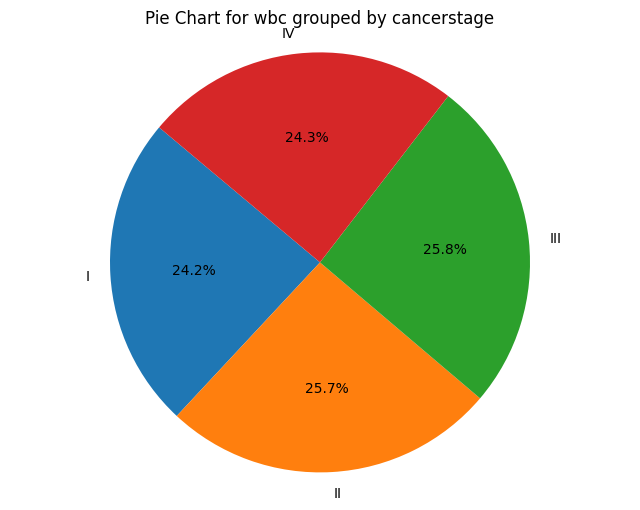

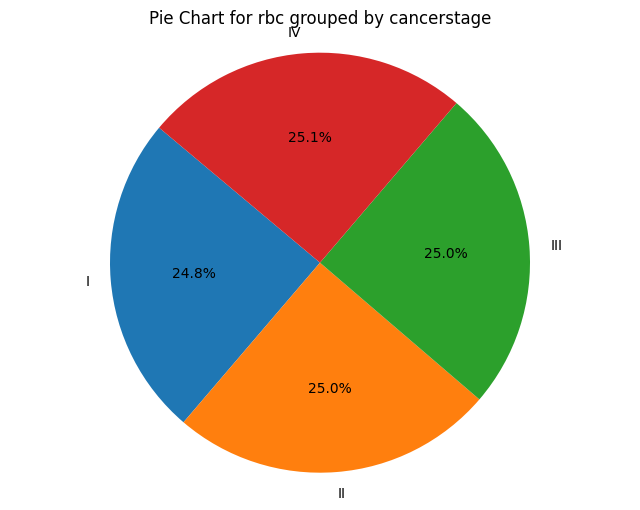

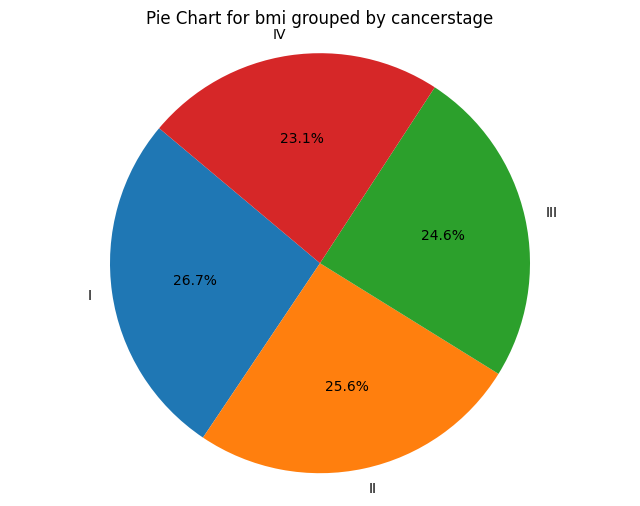

In [ ]:
plot_pie_chart(df, 'age', 'cancerstage')
plot_pie_chart(df, 'test1', 'cancerstage')
plot_pie_chart(df, 'test2', 'cancerstage')
plot_pie_chart(df, 'pain', 'cancerstage')
plot_pie_chart(df, 'tumorsize', 'cancerstage')
plot_pie_chart(df, 'co2', 'cancerstage')
plot_pie_chart(df, 'wound', 'cancerstage')
plot_pie_chart(df, 'mobility', 'cancerstage')
plot_pie_chart(df, 'ntumors', 'cancerstage')
plot_pie_chart(df, 'remission', 'cancerstage')
plot_pie_chart(df, 'lungcapacity', 'cancerstage')
plot_pie_chart(df, 'married', 'cancerstage')
plot_pie_chart(df, 'familyhx', 'cancerstage')
plot_pie_chart(df, 'smokinghx', 'cancerstage')
plot_pie_chart(df, 'wbc', 'cancerstage')
plot_pie_chart(df, 'rbc', 'cancerstage')
plot_pie_chart(df, 'bmi', 'cancerstage')

#Data Analysis with pandas DataFrame
##Importing Data

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
df=pd.read_csv("https://stats.idre.ucla.edu/stat/data/rdm/patient_pt2_dm.csv")

#Cleaning Our Data
Cleaning data is crucial as it ensures accurate analysis and modeling by removing inconsistencies, errors, and irrelevant information.

In [ ]:
df.head()

,hospital,hospid,docid,dis_date,sex,age,test1,test2,pain,tumorsize,...,remission,lungcapacity,married,familyhx,smokinghx,cancerstage,lengthofstay,wbc,rbc,bmi
0,Cedars-Sinai,3,3-227,1-Oct-09,male,54.201389,3.868794,1.368258,6,69.770042,...,0,0.910881,1,no,never,I,4,6422.606934,5.394183,32.246693
1,Cedars-Sinai,3,3-227,18-Feb-10,female,55.074692,7.755598,4.495320,8,68.034325,...,0,0.929844,1,no,never,II,6,5562.57373,4.792162,25.078077
2,Cedars-Sinai,3,3-227,30-Jun-09,female,58.058102,5.729780,-99.000000,7,65.060844,...,0,0.796421,0,-99,-99,IV,7,4994.978027,4.934001,28.882074
3,Cedars-Sinai,3,3-227,15-Nov-09,female,51.515800,8.579062,4.606732,9,71.438660,...,0,-98.000000,0,no,never,II,6,5368.994629,4.440117,20.150324
4,Cedars-Sinai,3,3-227,17-Feb-10,female,54.627316,6.698068,2.641949,4,69.524765,...,0,0.947164,1,yes,former,II,5,6668.87793,5.001358,25.719631


In [ ]:
# In one of the report of patient with ID 3-297, wbc is not assessed.

average_wbc = df[df['wbc'] != 'not assessed']['wbc'].astype(float).mean()

df.loc[(df['wbc'] == 'not assessed'), 'wbc'] = average_wbc

df['wbc'] = df['wbc'].astype(float) #Now we can Convert wbc column to float type
average_wbc

5989.2985929

In [ ]:
df.describe()

,hospid,age,test1,test2,pain,tumorsize,co2,wound,mobility,ntumors,remission,lungcapacity,married,lengthofstay,wbc,rbc,bmi
count,111.0,111.000000,111.000000,111.000000,111.000000,111.000000,111.000000,111.000000,111.000000,111.000000,111.000000,111.000000,111.000000,111.000000,111.000000,111.000000,111.000000
mean,3.0,52.470964,-5.035412,-4.089435,5.405405,69.404784,-4.654307,5.738739,5.882883,3.495495,0.225225,-17.127892,0.603604,5.486486,5989.298593,5.016295,27.810580
std,0.0,6.829335,29.879402,30.195151,1.608943,11.736433,24.327538,1.499768,1.438046,2.561512,0.419625,38.392260,0.491367,1.118968,1058.828316,0.276263,5.937299
min,3.0,37.229275,-99.000000,-99.000000,2.000000,38.672653,-98.000000,3.000000,3.000000,0.000000,0.000000,-99.000000,0.000000,3.000000,3363.489502,4.177895,18.675671
25%,3.0,47.640219,1.504661,2.512365,4.000000,62.257528,1.522789,5.000000,5.000000,1.500000,0.000000,0.570149,0.000000,5.000000,5327.483887,4.859969,23.799619
50%,3.0,52.404217,3.156762,4.002977,5.000000,68.044037,1.605025,6.000000,6.000000,3.000000,0.000000,0.777906,1.000000,5.000000,6095.838379,5.039895,26.157133
75%,3.0,57.321886,5.589737,6.542369,6.000000,78.629735,1.705378,7.000000,6.000000,5.000000,0.000000,0.876203,1.000000,6.000000,6695.971924,5.192725,30.996938
max,3.0,70.266167,23.727764,19.945618,9.000000,103.126480,2.047362,9.000000,9.000000,9.000000,1.000000,0.988512,1.000000,9.000000,8697.995117,5.660488,53.296059


##Handling Suspicious Values(outliers)
From above description of each column we can see that there are some suspicious values for eg.

1.In co2 column we have minimum value set as -98 but level of co2 can not be negative in human.

2.In lungcapacity also we have minimum value as -99 which is mismatching from rest of data.

3.Same goes for test1 and test2

We will assign these suspicious values as Mean

In [ ]:
#IQR(Inter Quartile Range)-First sort data,Find Q1,Q3 then find lower and upper fence(limit)
def detect_outliers(column): #pass numpy array in this function
  np.sort(column)
  q1,q3=np.percentile(column,[20,80])
  iqr=q3-q1
  l=q1-1.5*iqr
  u=q3+1.5*iqr
  return l,u

suspicious_columns=['test1','test2','co2','lungcapacity']
#replacing outliers with mean
for c in suspicious_columns:
    col = np.array(df[c])
    mean=np.mean(col)
    l, u = detect_outliers(col)
    for i in range(len(col)):
        if col[i] > u or col[i] < l:
            df[c][i] = mean
df.describe()

<ipython-input-5-0dabed801f53>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[c][i] = mean


,hospid,age,test1,test2,pain,tumorsize,co2,wound,mobility,ntumors,remission,lungcapacity,married,lengthofstay,wbc,rbc,bmi
count,111.0,111.000000,111.000000,111.000000,111.000000,111.000000,111.000000,111.000000,111.000000,111.000000,111.000000,111.000000,111.000000,111.000000,111.000000,111.000000,111.000000
mean,3.0,52.470964,2.993030,3.898423,5.405405,69.404784,1.171983,5.738739,5.882883,3.495495,0.225225,-2.439224,0.603604,5.486486,5989.298593,5.016295,27.810580
std,0.0,6.829335,3.743105,4.060770,1.608943,11.736433,1.635933,1.499768,1.438046,2.561512,0.419625,6.918728,0.491367,1.118968,1058.828316,0.276263,5.937299
min,3.0,37.229275,-5.035412,-4.089435,2.000000,38.672653,-4.654307,3.000000,3.000000,0.000000,0.000000,-17.127892,0.000000,3.000000,3363.489502,4.177895,18.675671
25%,3.0,47.640219,1.314068,2.337465,4.000000,62.257528,1.519558,5.000000,5.000000,1.500000,0.000000,0.570149,0.000000,5.000000,5327.483887,4.859969,23.799619
50%,3.0,52.404217,3.000840,3.858716,5.000000,68.044037,1.604917,6.000000,6.000000,3.000000,0.000000,0.777906,1.000000,5.000000,6095.838379,5.039895,26.157133
75%,3.0,57.321886,5.380656,5.920308,6.000000,78.629735,1.699967,7.000000,6.000000,5.000000,0.000000,0.876203,1.000000,6.000000,6695.971924,5.192725,30.996938
max,3.0,70.266167,11.802611,14.029442,9.000000,103.126480,1.945897,9.000000,9.000000,9.000000,1.000000,0.988512,1.000000,9.000000,8697.995117,5.660488,53.296059


In [ ]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 111 entries, 0 to 110
Data columns (total 24 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   hospital      111 non-null    object 
 1   hospid        111 non-null    int64  
 2   docid         111 non-null    object 
 3   dis_date      111 non-null    object 
 4   sex           111 non-null    object 
 5   age           111 non-null    float64
 6   test1         111 non-null    float64
 7   test2         111 non-null    float64
 8   pain          111 non-null    int64  
 9   tumorsize     111 non-null    float64
 10  co2           111 non-null    float64
 11  wound         111 non-null    int64  
 12  mobility      111 non-null    int64  
 13  ntumors       111 non-null    int64  
 14  remission     111 non-null    int64  
 15  lungcapacity  111 non-null    float64
 16  married       111 non-null    int64  
 17  familyhx      111 non-null    object 
 18  smokinghx     111 non-null    

##One Hot encoding
As we have no NULL values in our data, so we can proceed towards One Hot Encoding
For categorical analysis, we will perform one-hot encoding on the columns with DataType as object. This step is performed due to the tendency of Machine Learning algorithms to work better with numerical data. The one-hot encoding process transforms categorical variables into a binary (0 or 1) format.

In [ ]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
# df['docid'] = label_encoder.fit_transform(df['docid']) #docid will be unique for each patient so assigning available docid's with integer from 0 to 16(as we have 16 different docids) in ascending order
df['sex']=label_encoder.fit_transform(df['sex'])  # male assigned 1 and female assigned 0
df['familyhx']=label_encoder.fit_transform(df['familyhx'])  # familtyhx=1 for no, 0 for -99 and 2 for yes
df['smokinghx']=label_encoder.fit_transform(df['smokinghx'])  #smokinghx=0 for -99,1 for current,2 for former and 3 for never,
df['cancerstage']=label_encoder.fit_transform(df['cancerstage'])  # cancerstage 0 for I,1 for II,2 for III and 3 for IV

df

,hospital,hospid,docid,dis_date,sex,age,test1,test2,pain,tumorsize,...,remission,lungcapacity,married,familyhx,smokinghx,cancerstage,lengthofstay,wbc,rbc,bmi
0,Cedars-Sinai,3,3-227,1-Oct-09,1,54.201389,3.868794,1.368258,6,69.770042,...,0,0.910881,1,1,3,0,4,6422.606934,5.394183,32.246693
1,Cedars-Sinai,3,3-227,18-Feb-10,0,55.074692,7.755598,4.495320,8,68.034325,...,0,0.929844,1,1,3,1,6,5562.573730,4.792162,25.078077
2,Cedars-Sinai,3,3-227,30-Jun-09,0,58.058102,5.729780,-4.089435,7,65.060844,...,0,0.796421,0,0,0,3,7,4994.978027,4.934001,28.882074
3,Cedars-Sinai,3,3-227,15-Nov-09,0,51.515800,8.579062,4.606732,9,71.438660,...,0,-17.127892,0,1,3,1,6,5368.994629,4.440117,20.150324
4,Cedars-Sinai,3,3-227,17-Feb-10,0,54.627316,6.698068,2.641949,4,69.524765,...,0,0.947164,1,2,2,1,5,6668.877930,5.001358,25.719631
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,Cedars-Sinai,3,3-394,6-May-09,1,47.191719,2.881405,6.446904,6,64.918655,...,0,-17.127892,0,1,3,1,6,5745.301758,5.000554,25.245277
107,Cedars-Sinai,3,3-227,17-Feb-10,0,54.627316,6.698068,2.641949,4,69.524765,...,0,0.947164,1,2,2,1,5,6668.877930,5.001358,25.719631
108,Cedars-Sinai,3,3-297,25-Mar-10,1,70.266167,2.313693,2.895832,4,63.432571,...,0,0.865182,1,1,3,1,6,7452.634766,5.374302,23.797901
109,Cedars-Sinai,3,3-351,20-Oct-10,0,52.404217,6.047618,1.855576,6,79.024216,...,1,0.787710,1,1,1,0,3,7570.229492,4.910630,33.976368


#Understanding and Visualizing Our Data

In [ ]:
df1=df
df1.drop(columns=['hospid'],inplace=True) #as hospital id is same throughout our data so it is of no use.

<ipython-input-44-4b01c06ce174>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df1.corr(),cmap='RdBu_r',annot=True, vmin=-1, vmax=1); # Highlights the feature which are highly related or unrelated


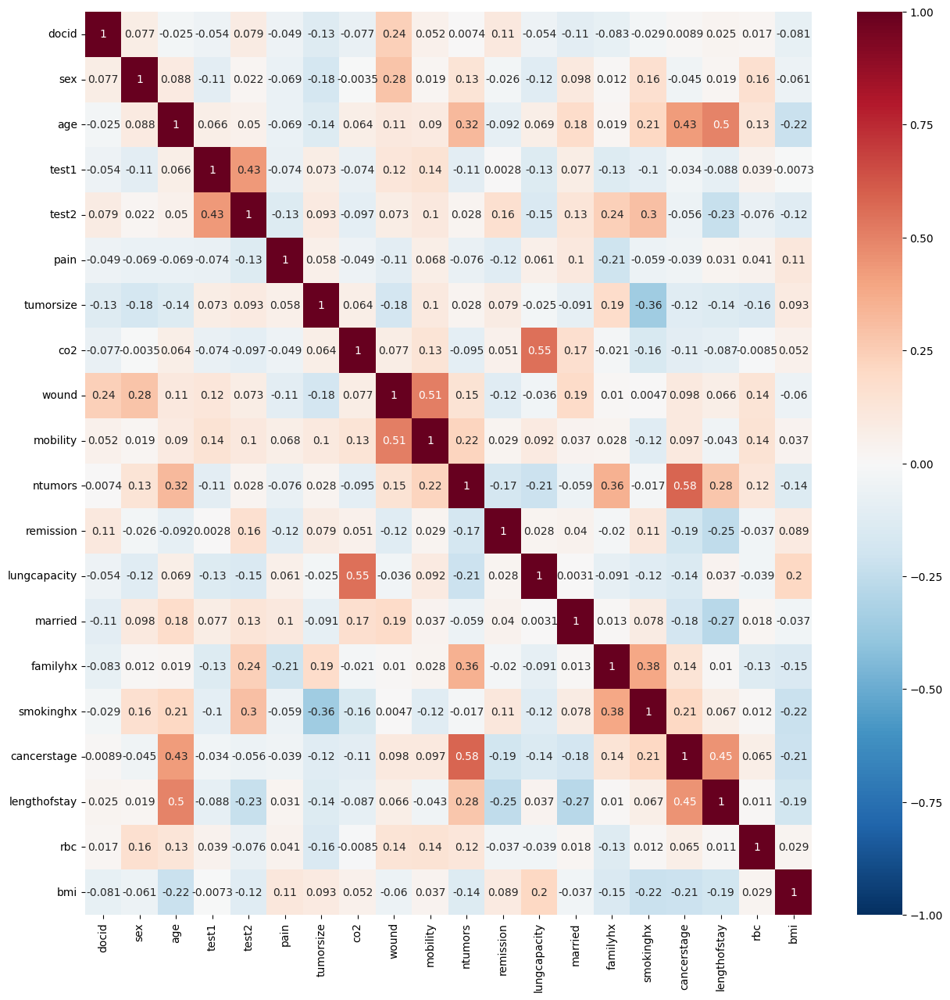

In [ ]:
fig, ax = plt.subplots(figsize=(15,15))
sns.heatmap(df1.corr(),cmap='RdBu_r',annot=True, vmin=-1, vmax=1); # Highlights the feature which are highly related or unrelated

##Here are some interesting insights we can get from the data:

Positive correlations:

1.There is a positive correlation between tumorsize and smokinghx (0.36). This suggests that people with a history of smoking are more likely to have larger tumors.

2.There is a positive correlation between smokinghx and cancerstage (0.21). This is again intuitive, as smoking is a major risk factor for cancer.
There is a positive correlation between familyhx and cancerstage (0.38). This suggests that people with a family history of cancer are more likely to develop cancer themselves.

3.There is a positive correlation between lengthofstay and cancerstage (0.45). This means that patients with higher cancer stages tend to stay in the hospital for longer durations.

4.There is a positive correlation between wound and mobility (0.51). This suggests that patients with wounds are likely to have reduced mobility.
Negative correlations:

There is a negative correlation between age and lungcapacity (-0.75). This is unsurprising, as lung capacity naturally decreases with age.

1.There is a negative correlation between smokinghx and lungcapacity (-0.22). Smoking is a known cause of lung damage and reduced lung capacity.
There is a negative correlation between cancerstage and remission (-0.21). This relationship makes sense because higher cancer stages are typically associated with lower remission rates.

2.There is a negative correlation between lengthofstay and bmi (-0.21). This could be because patients with lower BMIs tend to have weaker immune systems and may take longer to recover from surgery or illness.

Overall, the heatmap provides some interesting insights into the relationships between various features in your hospital dataset. These insights can be helpful for understanding patient risk factors, predicting patient outcomes, and developing more effective treatment plans.

Here are some additional points to consider when interpreting the heatmap:

The strength of a correlation is indicated by the intensity of the color in the heatmap. A deeper red color indicates a stronger positive correlation, while a deeper blue color indicates a stronger negative correlation.
The heatmap only shows correlations between pairs of features. It does not necessarily mean that there is a causal relationship between two features.
It is important to consider the context of the data when interpreting the heatmap. For example, the correlation between smokinghx and lungcapacity may be weaker for younger patients than for older patients.


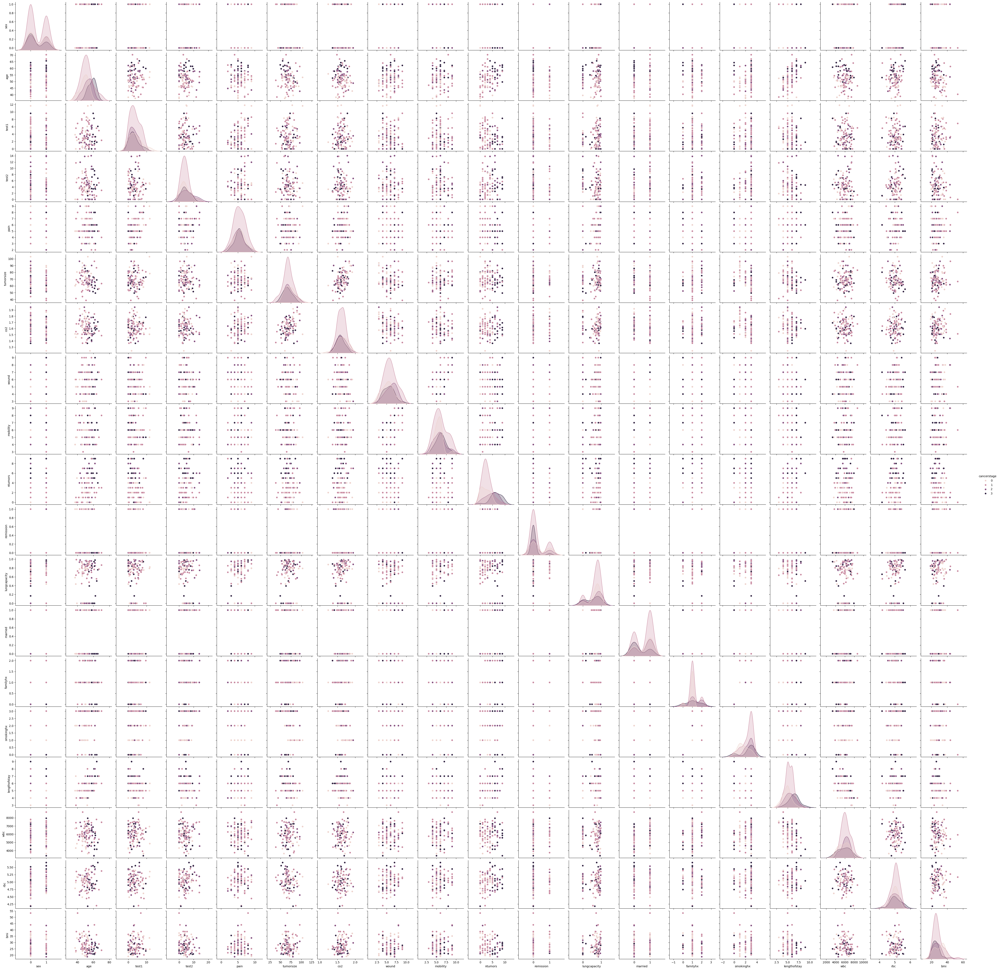

In [ ]:
sns.pairplot(df1,hue='cancerstage')

##Meaningful insights from pairplot
The pairplot shows the relationships between various features in your hospital data, colored by the patient’s cancer stage. Here are some interesting insights we can glean from the data:

Tumor size and Cancer Stage: There appears to be a positive correlation between tumor size and cancer stage. This means that patients with higher cancer stages tend to have larger tumors. This is consistent with the findings from the heatmap.

Number of tumors and Cancer Stage: The relationship between the number of tumors and cancer stage seems inconclusive. There is some overlap across stages, making it difficult to see a clear trend.

Remission and Cancer Stage: Patients with lower cancer stages tend to have higher remission rates. This is expected  because it’s generally easier to treat cancers that haven’t spread as far.

Length of Stay and Cancer Stage: There appears to be a positive correlation between length of stay and cancer stage. This is consistent with the findings from the heatmap and suggests that patients with higher cancer stages tend to stay in the hospital for longer durations.

Smoking and Cancer Stage: While the data is a bit scattered, there is some suggestion that smoking is more prevalent in higher cancer stages. This aligns with the findings from the heatmap.

Age and Cancer Stage: It is difficult to see a clear relationship between age and cancer stage based on this pairplot.

BMI and Cancer Stage: There is no clear relationship between BMI and cancer stage evident from this pairplot.

Overall, the pairplot provides further confirmation of some of the trends identified in the heatmap, such as the positive correlation between tumor size and cancer stage and the negative correlation between remission and cancer stage. It also suggests some new insights, such as the possible link between smoking and cancer stage.

Here are some additional points to consider when interpreting the pairplot:

The size of the dots in the scatter plots indicates the number of data points for each combination of variables. More data points are represented by larger dots.

The pairplot only shows relationships between pairs of features. It does not necessarily mean that there is a causal relationship between two features.
It is important to consider the context of the data when interpreting the pairplot. For example, the relationship between smoking and cancer stage may be weaker for younger patients than for older patients.

#Plot density Plots
Constructing density plots for each variable to visualize the probability density function of the data. This can provide insights into the distribution shape and identify any skewness or multimodality in the data.

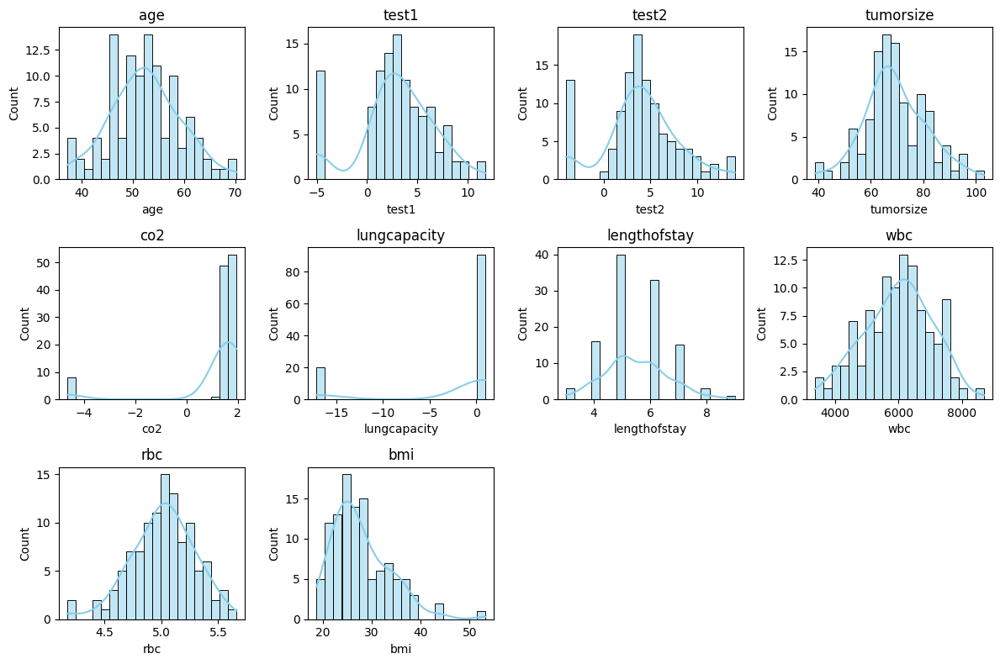

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Selecting columns for density plots
columns_for_density_plots = ['age', 'test1', 'test2', 'tumorsize', 'co2', 'lungcapacity', 'lengthofstay', 'wbc', 'rbc', 'bmi']

# Set up the matplotlib figure
plt.figure(figsize=(12, 8))

# Loop through each column and draw density plot
for i, col in enumerate(columns_for_density_plots, 1):
    plt.subplot(3, 4, i)
    sns.histplot(df[col], kde=True, color='skyblue', bins=20)
    plt.title(col)

plt.tight_layout()
plt.show()


#Cluster Analysis
Applying clustering algorithms to identify groupings or clusters within the data. Visualizing the clusters to understand the relationships between variables within each cluster.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-13-47beb4a782ec>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cluster['Cluster'] = cluster_labels


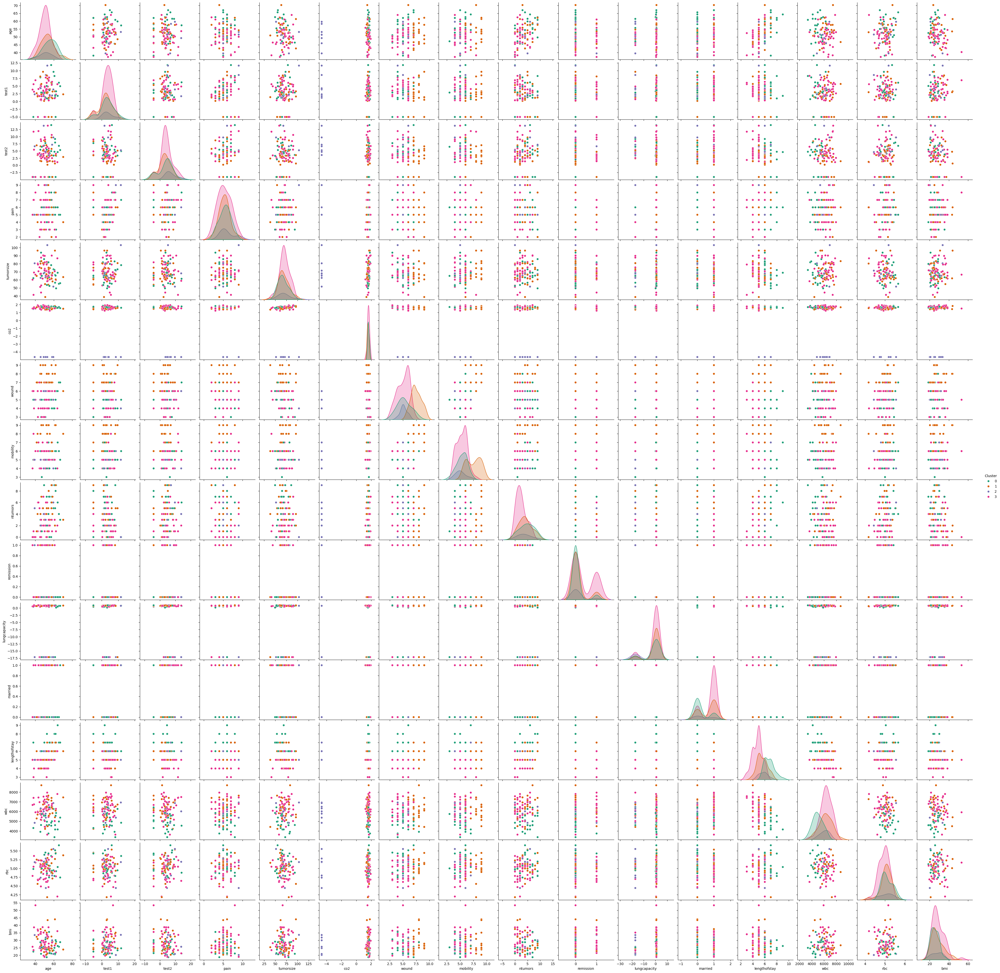

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Create a new dataframe for clustering
df_cluster = df[['age', 'test1', 'test2', 'pain', 'tumorsize', 'co2', 'wound', 'mobility', 'ntumors', 'remission', 'lungcapacity', 'married', 'lengthofstay', 'wbc', 'rbc', 'bmi']]

# Standardize the data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_cluster)

# Choose the number of clusters (k)
k = 4  # we can experiment with different values of k

# Apply K-means clustering
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(df_scaled)
cluster_labels = kmeans.labels_

# Add cluster labels to the original dataframe
df_cluster['Cluster'] = cluster_labels

# Visualize the clusters using pairplot
sns.pairplot(df_cluster, hue='Cluster', palette='Dark2', diag_kind='kde')
plt.show()

#Let's Visualize data in Lower Dimension Using Principal Component Analysis(PCA)

##Why reducing dimensions?
Adding new features to a dataset can bring in valuable information, however, they will slow the training process and make it harder to find good patterns and solutions. In Data Science this is called the Curse of Dimensionality and it often leads to skewed interpretation of data and inaccurate predictions.

Principal Component Analysis (PCA) is the most popular algorithm for Dimensionality Reduction. At its functioning core, it projects the data onto a hyperplane, aiming to make the rotated features statistically uncorrelated.The rotation is typically followed by selecting a subset of these new projected features, based on their importance in describing the data.

for eg. in below Image x_1 and x_2 are our original features and p_1 is our reduced feature which collectively represents x_1 and x_2.
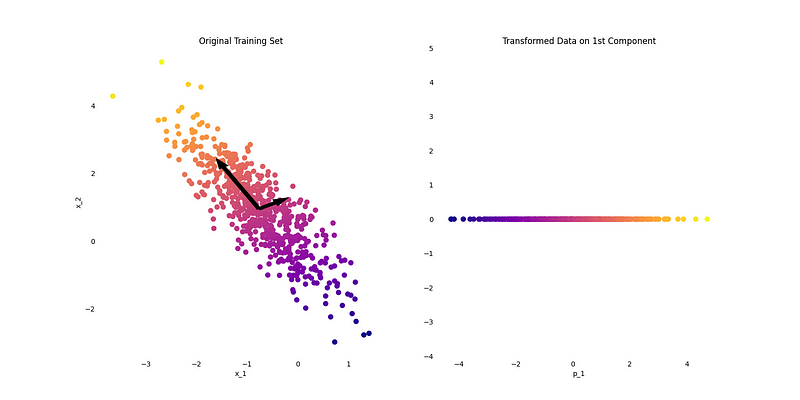

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=.95) #to get 95% of data variance
df2=df.loc[:,['age','test1','test2','pain','tumorsize','co2','wound','mobility','ntumors','remission','married','lungcapacity','rbc','bmi']]
pca.fit(df2)
X_transformed = pca.transform(df2)

print(X_transformed.shape) #this are optimal number of features we will need after dimensionality reduction to get 95% variance in our data

(111, 5)


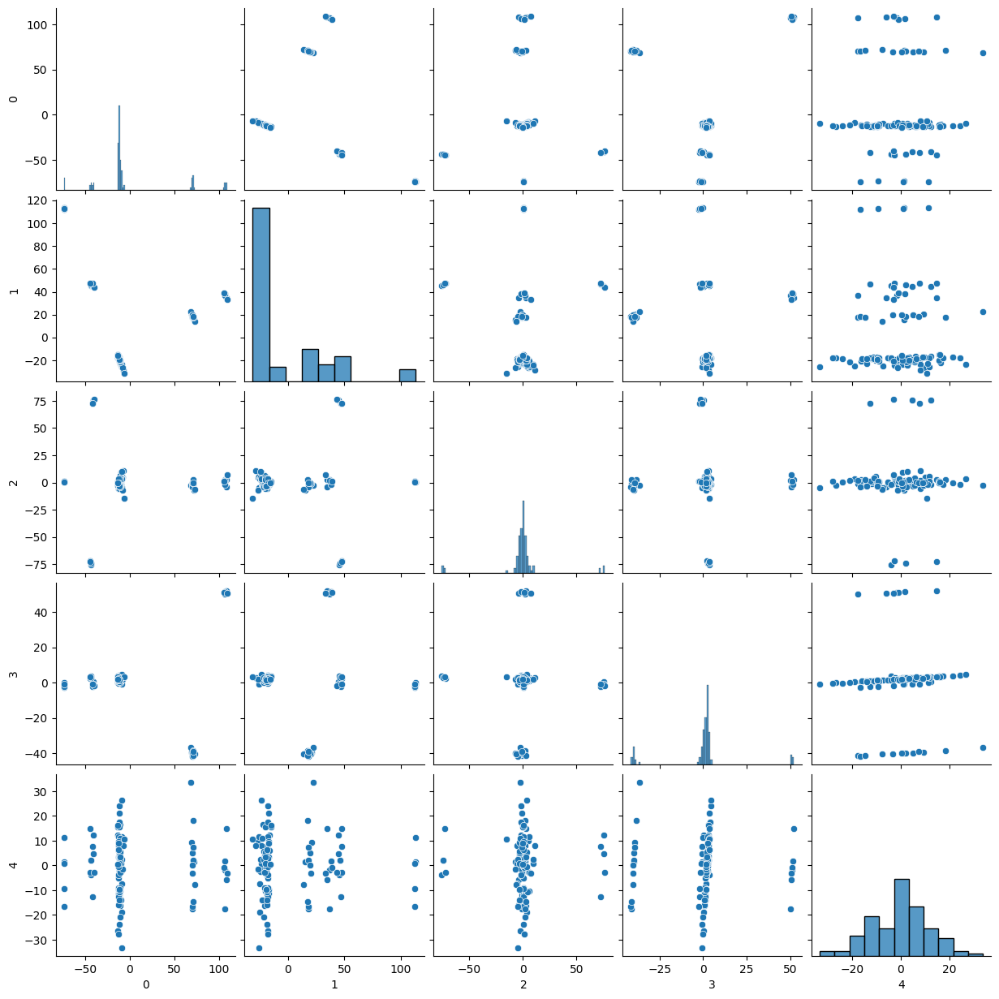

In [ ]:
df2=pd.DataFrame(X_transformed) #to convert numpy n-d array to pandas dataframe
#Further It will be convient ,if we want to apply Some machine learning model on this data
sns.pairplot(df2)